# 🔥 豚脳スライス画像の特徴点ベース画像レジストレーション 🔥

## 概要
強度ベース手法（位相相関→アフィン→B-Spline）で相関係数0.44で頭打ちとなったため、
**特徴点ベース手法（AKAZE + BFMatcher + RANSAC）**に切り替えて高精度位置合わせを実現します。

## 手法の流れ
1. **AKAZE特徴点検出** - 血管断面・細胞塊・染色パターンを特徴点として抽出
2. **BFMatcher + Lowe's ratio test** - ロバストな特徴点マッチング
3. **RANSAC アフィン変換** - 外れ値に強い変換行列推定
4. **画像ワープと評価** - 高精度位置合わせと定量評価

## 目標
- **相関係数 0.8以上** の達成
- 強度ベース手法からの大幅改善

## 1. ライブラリインポートと環境チェック

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import warnings
from skimage.metrics import structural_similarity as ssim
from scipy.stats import pearsonr
import json
from datetime import datetime

# 設定
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 12

print("🔥 特徴点ベース画像レジストレーション開始！🔥")
print(f"OpenCV Version: {cv2.__version__}")

# 特徴点検出器の利用可能性チェック
detectors_available = {}

try:
    akaze = cv2.AKAZE_create()
    detectors_available['AKAZE'] = "✅ 利用可能"
except:
    detectors_available['AKAZE'] = "❌ 不可"

try:
    orb = cv2.ORB_create()
    detectors_available['ORB'] = "✅ 利用可能"
except:
    detectors_available['ORB'] = "❌ 不可"

print("\n特徴点検出器:")
for detector, status in detectors_available.items():
    print(f"  {detector}: {status}")

if not any("✅" in status for status in detectors_available.values()):
    print("⚠️  警告: opencv-contrib-pythonをインストールしてください")
    print("pip install opencv-contrib-python")

print("\n✅ 環境チェック完了！")

🔥 特徴点ベース画像レジストレーション開始！🔥
OpenCV Version: 4.11.0

特徴点検出器:
  AKAZE: ✅ 利用可能
  ORB: ✅ 利用可能

✅ 環境チェック完了！


## 2. 画像読み込み

📂 画像読み込み中...
固定画像: /Users/horiieikkei/Desktop/VS code/test_2images/test2slices/cropped_MMP_109_x4_largest copy.tif
移動画像: /Users/horiieikkei/Desktop/VS code/test_2images/test2slices/cropped_MMP_110_x4_largest copy.tif
✅ 読み込み完了
固定画像サイズ: (1481, 1638)
移動画像サイズ: (1606, 1639)


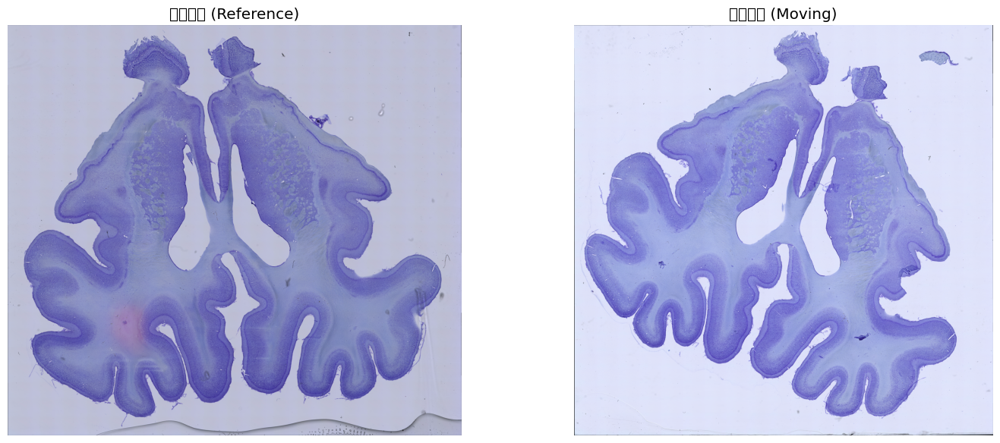

In [2]:
# 画像パス設定
IMAGE_DIR = "/Users/horiieikkei/Desktop/VS code/test_2images/test2slices"
fixed_path = os.path.join(IMAGE_DIR, "cropped_MMP_109_x4_largest copy.tif")
moving_path = os.path.join(IMAGE_DIR, "cropped_MMP_110_x4_largest copy.tif")

print("📂 画像読み込み中...")
print(f"固定画像: {fixed_path}")
print(f"移動画像: {moving_path}")

# ファイル存在確認
if not os.path.exists(fixed_path):
    raise FileNotFoundError(f"固定画像が見つかりません: {fixed_path}")
if not os.path.exists(moving_path):
    raise FileNotFoundError(f"移動画像が見つかりません: {moving_path}")

# 画像読み込み
fixed_img = cv2.imread(fixed_path)
moving_img = cv2.imread(moving_path)

if fixed_img is None or moving_img is None:
    raise ValueError("画像の読み込みに失敗しました")

# RGB変換（matplotlib表示用）
fixed_rgb = cv2.cvtColor(fixed_img, cv2.COLOR_BGR2RGB)
moving_rgb = cv2.cvtColor(moving_img, cv2.COLOR_BGR2RGB)

# グレースケール変換
fixed_gray = cv2.cvtColor(fixed_img, cv2.COLOR_BGR2GRAY)
moving_gray = cv2.cvtColor(moving_img, cv2.COLOR_BGR2GRAY)

print(f"✅ 読み込み完了")
print(f"固定画像サイズ: {fixed_gray.shape}")
print(f"移動画像サイズ: {moving_gray.shape}")

# 画像表示
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes[0].imshow(fixed_rgb)
axes[0].set_title("固定画像 (Reference)")
axes[0].axis('off')

axes[1].imshow(moving_rgb)
axes[1].set_title("移動画像 (Moving)")
axes[1].axis('off')

plt.tight_layout()
plt.show()

## 3. 前処理（CLAHE + ガウシアンフィルタ）

🔧 画像前処理中...
✅ 前処理完了


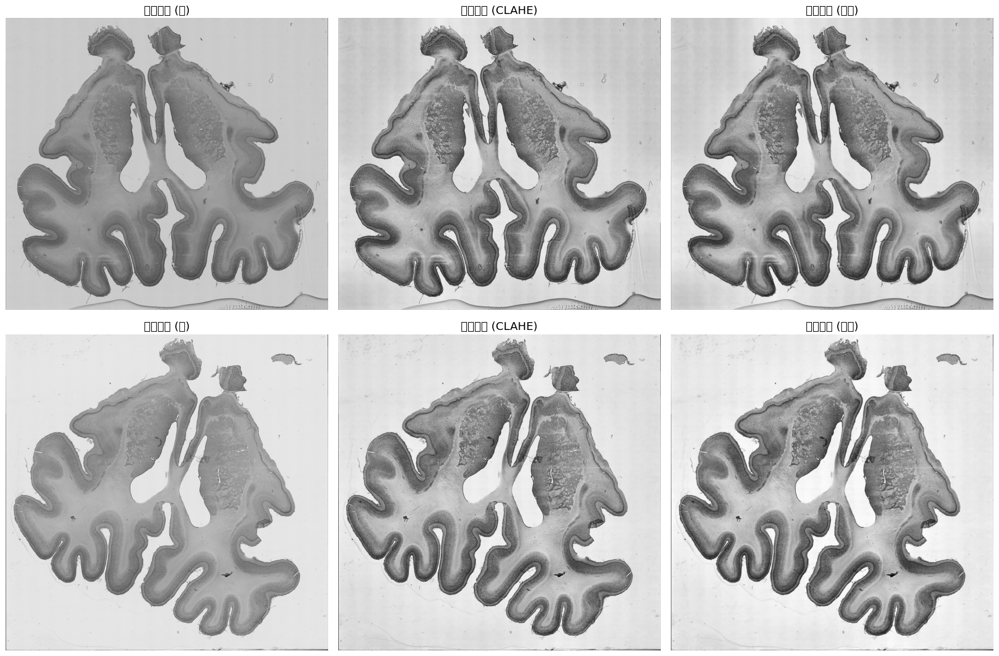

In [3]:
print("🔧 画像前処理中...")

# CLAHE (Contrast Limited Adaptive Histogram Equalization)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
fixed_enhanced = clahe.apply(fixed_gray)
moving_enhanced = clahe.apply(moving_gray)

# ガウシアンフィルタでノイズ除去
fixed_filtered = cv2.GaussianBlur(fixed_enhanced, (3, 3), 1.0)
moving_filtered = cv2.GaussianBlur(moving_enhanced, (3, 3), 1.0)

print("✅ 前処理完了")

# 前処理結果の可視化
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 元画像
axes[0, 0].imshow(fixed_gray, cmap='gray')
axes[0, 0].set_title("固定画像 (元)")
axes[0, 0].axis('off')

axes[1, 0].imshow(moving_gray, cmap='gray')
axes[1, 0].set_title("移動画像 (元)")
axes[1, 0].axis('off')

# CLAHE適用後
axes[0, 1].imshow(fixed_enhanced, cmap='gray')
axes[0, 1].set_title("固定画像 (CLAHE)")
axes[0, 1].axis('off')

axes[1, 1].imshow(moving_enhanced, cmap='gray')
axes[1, 1].set_title("移動画像 (CLAHE)")
axes[1, 1].axis('off')

# 最終処理後
axes[0, 2].imshow(fixed_filtered, cmap='gray')
axes[0, 2].set_title("固定画像 (最終)")
axes[0, 2].axis('off')

axes[1, 2].imshow(moving_filtered, cmap='gray')
axes[1, 2].set_title("移動画像 (最終)")
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# 処理後画像を保存
processed_fixed = fixed_filtered
processed_moving = moving_filtered

## 4. AKAZE特徴点検出

🎯 AKAZE特徴点検出中...
✅ AKAZE特徴点検出完了 (0.692秒)
固定画像の特徴点数: 3585
移動画像の特徴点数: 4469
ディスクリプタ形状: 固定=(3585, 61), 移動=(4469, 61)


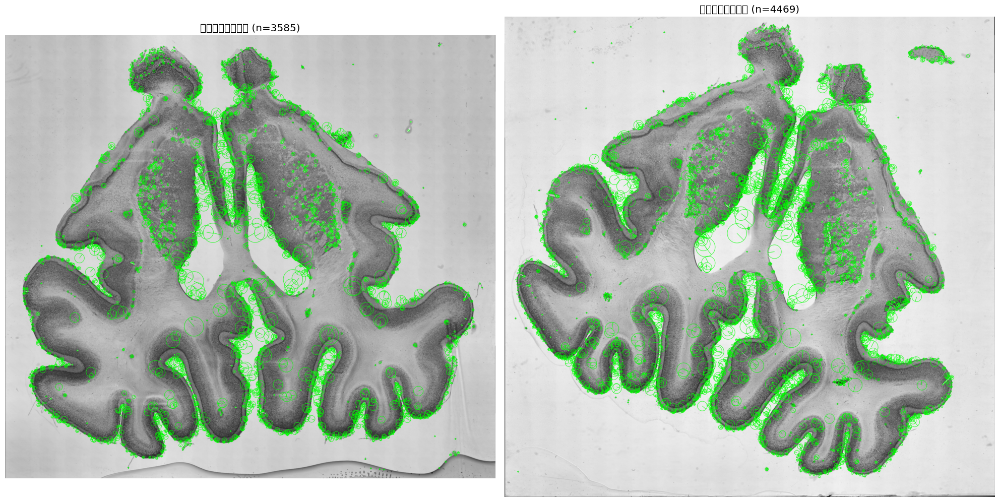

✅ 十分な特徴点が検出されました


In [4]:
print("🎯 AKAZE特徴点検出中...")

# AKAZE検出器作成
try:
    akaze = cv2.AKAZE_create(
        threshold=0.001,  # 特徴点検出の閾値
        nOctaves=4,       # オクターブ数
        nOctaveLayers=4   # レイヤー数
    )
    detector_name = "AKAZE"
except:
    print("⚠️  AKAZEが使えません。ORBを使用します")
    akaze = cv2.ORB_create(nfeatures=2000)
    detector_name = "ORB"

# 特徴点検出とディスクリプタ抽出
start_time = time.time()

kp_fixed, desc_fixed = akaze.detectAndCompute(processed_fixed, None)
kp_moving, desc_moving = akaze.detectAndCompute(processed_moving, None)

detection_time = time.time() - start_time

print(f"✅ {detector_name}特徴点検出完了 ({detection_time:.3f}秒)")
print(f"固定画像の特徴点数: {len(kp_fixed)}")
print(f"移動画像の特徴点数: {len(kp_moving)}")

if desc_fixed is None or desc_moving is None:
    raise ValueError("ディスクリプタの抽出に失敗しました")

print(f"ディスクリプタ形状: 固定={desc_fixed.shape}, 移動={desc_moving.shape}")

# 特徴点可視化
img_kp_fixed = cv2.drawKeypoints(processed_fixed, kp_fixed, None, 
                                color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_kp_moving = cv2.drawKeypoints(processed_moving, kp_moving, None, 
                                 color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(img_kp_fixed)
axes[0].set_title(f"固定画像の特徴点 (n={len(kp_fixed)})")
axes[0].axis('off')

axes[1].imshow(img_kp_moving)
axes[1].set_title(f"移動画像の特徴点 (n={len(kp_moving)})")
axes[1].axis('off')

plt.tight_layout()
plt.show()

# 特徴点数チェック
min_features = 50
if len(kp_fixed) < min_features or len(kp_moving) < min_features:
    print(f"⚠️  警告: 特徴点数が少なすぎます (推奨: {min_features}以上)")
else:
    print("✅ 十分な特徴点が検出されました")

## 5. 特徴点マッチング (BFMatcher + Lowe's ratio test)

🔗 特徴点マッチング中...
BFMatcher設定: HAMMING
✅ マッチング完了 (0.212秒)
初期マッチ数: 3585
✅ Lowe's ratio test完了 (閾値: 0.75)
良好マッチ数: 394
マッチ残存率: 11.0%


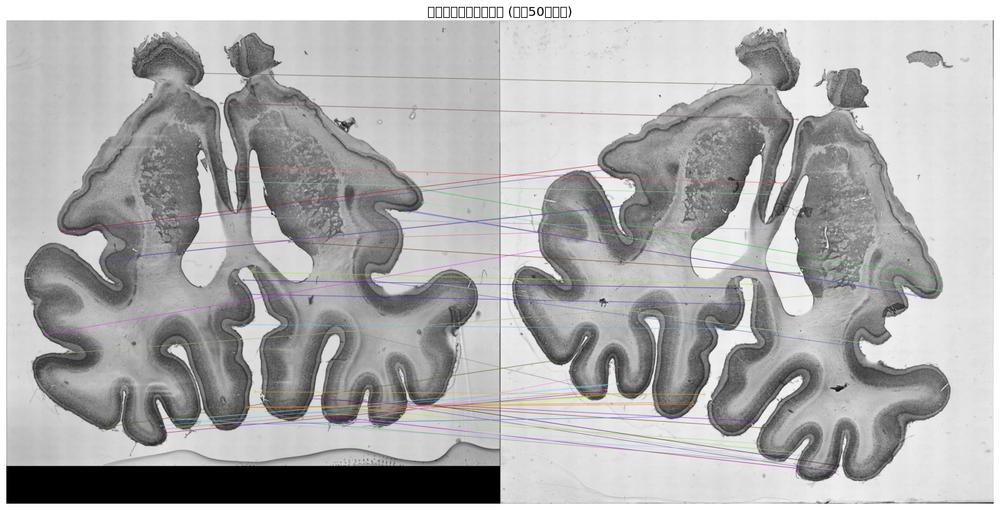


マッチ距離統計:
  平均: 54.94
  標準偏差: 17.51
  範囲: 19.00 - 105.00
✅ 十分なマッチが得られました


In [5]:
print("🔗 特徴点マッチング中...")

# BFMatcher設定
if desc_fixed.dtype == np.uint8:
    # バイナリディスクリプタ (AKAZE, ORB)
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    norm_type = "HAMMING"
else:
    # 浮動小数点ディスクリプタ (SIFT)
    matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    norm_type = "L2"

print(f"BFMatcher設定: {norm_type}")

# k-NNマッチング (k=2)
start_time = time.time()
matches = matcher.knnMatch(desc_fixed, desc_moving, k=2)
matching_time = time.time() - start_time

print(f"✅ マッチング完了 ({matching_time:.3f}秒)")
print(f"初期マッチ数: {len(matches)}")

# Lowe's ratio test
ratio_threshold = 0.75
good_matches = []

for match_pair in matches:
    if len(match_pair) == 2:
        m, n = match_pair
        if m.distance < ratio_threshold * n.distance:
            good_matches.append(m)

print(f"✅ Lowe's ratio test完了 (閾値: {ratio_threshold})")
print(f"良好マッチ数: {len(good_matches)}")
print(f"マッチ残存率: {len(good_matches)/len(matches)*100:.1f}%")

# マッチング結果可視化
if len(good_matches) > 0:
    # 距離でソートして上位50個を表示
    sorted_matches = sorted(good_matches, key=lambda x: x.distance)
    display_matches = sorted_matches[:50]
    
    img_matches = cv2.drawMatches(processed_fixed, kp_fixed, 
                                 processed_moving, kp_moving, 
                                 display_matches, None,
                                 flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.imshow(img_matches)
    ax.set_title(f"特徴点マッチング結果 (上位{len(display_matches)}マッチ)")
    ax.axis('off')
    plt.show()
    
    # 距離統計
    distances = [m.distance for m in good_matches]
    print(f"\nマッチ距離統計:")
    print(f"  平均: {np.mean(distances):.2f}")
    print(f"  標準偏差: {np.std(distances):.2f}")
    print(f"  範囲: {min(distances):.2f} - {max(distances):.2f}")
else:
    print("❌ 良好なマッチが見つかりませんでした")
    raise ValueError("マッチング失敗")

# マッチ数チェック
min_matches = 10
if len(good_matches) < min_matches:
    print(f"⚠️  警告: マッチ数不足 (最小推奨: {min_matches})")
else:
    print("✅ 十分なマッチが得られました")

## 6. RANSAC アフィン変換推定

⚡ RANSAC アフィン変換推定中...
対応点数: 394
✅ RANSAC完了 (0.002秒)

インライア分析:
  総マッチ数: 394
  インライア数: 59
  インライア率: 0.150 (15.0%)

変換パラメータ:
  平行移動: (465.89, -217.19)
  スケール: (0.9918, 0.9918)
  回転角度: -25.25度

アフィン変換行列:
[[ 8.97041164e-01 -4.23015418e-01  4.65889410e+02]
 [ 4.23015418e-01  8.97041164e-01 -2.17194361e+02]]


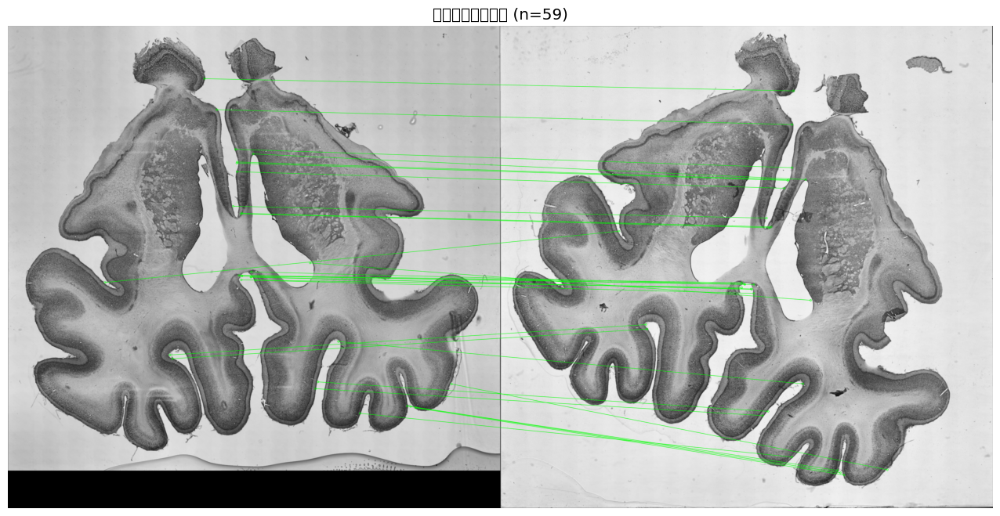

⚠️  警告: インライア率が低いです


In [6]:
print("⚡ RANSAC アフィン変換推定中...")

if len(good_matches) < 6:
    raise ValueError(f"アフィン変換には最低6点必要 (現在: {len(good_matches)})")

# 対応点座標抽出
src_pts = np.float32([kp_fixed[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp_moving[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

print(f"対応点数: {len(src_pts)}")

# RANSAC実行
start_time = time.time()
affine_matrix, mask = cv2.estimateAffinePartial2D(
    src_pts, dst_pts,
    method=cv2.RANSAC,
    ransacReprojThreshold=3.0,  # インライア閾値
    maxIters=2000,              # 最大反復回数
    confidence=0.99             # 信頼度
)
ransac_time = time.time() - start_time

if affine_matrix is None:
    raise ValueError("RANSAC変換推定に失敗しました")

print(f"✅ RANSAC完了 ({ransac_time:.3f}秒)")

# インライア分析
inliers = mask.ravel() == 1
n_inliers = np.sum(inliers)
inlier_ratio = n_inliers / len(good_matches)

print(f"\nインライア分析:")
print(f"  総マッチ数: {len(good_matches)}")
print(f"  インライア数: {n_inliers}")
print(f"  インライア率: {inlier_ratio:.3f} ({inlier_ratio*100:.1f}%)")

# 変換パラメータ解析
def analyze_affine_matrix(matrix):
    a, b = matrix[0, 0], matrix[0, 1]
    c, d = matrix[1, 0], matrix[1, 1]
    tx, ty = matrix[0, 2], matrix[1, 2]
    
    scale_x = np.sqrt(a*a + b*b)
    scale_y = np.sqrt(c*c + d*d)
    rotation = np.arctan2(b, a) * 180 / np.pi
    
    return {
        'translation': (tx, ty),
        'scale': (scale_x, scale_y),
        'rotation': rotation
    }

transform_params = analyze_affine_matrix(affine_matrix)

print(f"\n変換パラメータ:")
print(f"  平行移動: ({transform_params['translation'][0]:.2f}, {transform_params['translation'][1]:.2f})")
print(f"  スケール: ({transform_params['scale'][0]:.4f}, {transform_params['scale'][1]:.4f})")
print(f"  回転角度: {transform_params['rotation']:.2f}度")

print(f"\nアフィン変換行列:")
print(affine_matrix)

# インライア/アウトライア可視化
inlier_matches = [good_matches[i] for i in range(len(good_matches)) if mask[i]]
outlier_matches = [good_matches[i] for i in range(len(good_matches)) if not mask[i]]

if len(inlier_matches) > 0:
    img_inliers = cv2.drawMatches(
        processed_fixed, kp_fixed, processed_moving, kp_moving,
        inlier_matches[:30], None,
        matchColor=(0, 255, 0),  # 緑
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    
    fig, ax = plt.subplots(figsize=(20, 8))
    ax.imshow(img_inliers)
    ax.set_title(f"インライアマッチ (n={len(inlier_matches)})")
    ax.axis('off')
    plt.show()

if inlier_ratio < 0.3:
    print("⚠️  警告: インライア率が低いです")
else:
    print("✅ 良好なインライア率です")

## 7. 画像変換と位置合わせ

🔄 画像変換実行中...
✅ 変換完了 (0.037秒)
有効ピクセル率: 0.869 (86.9%)


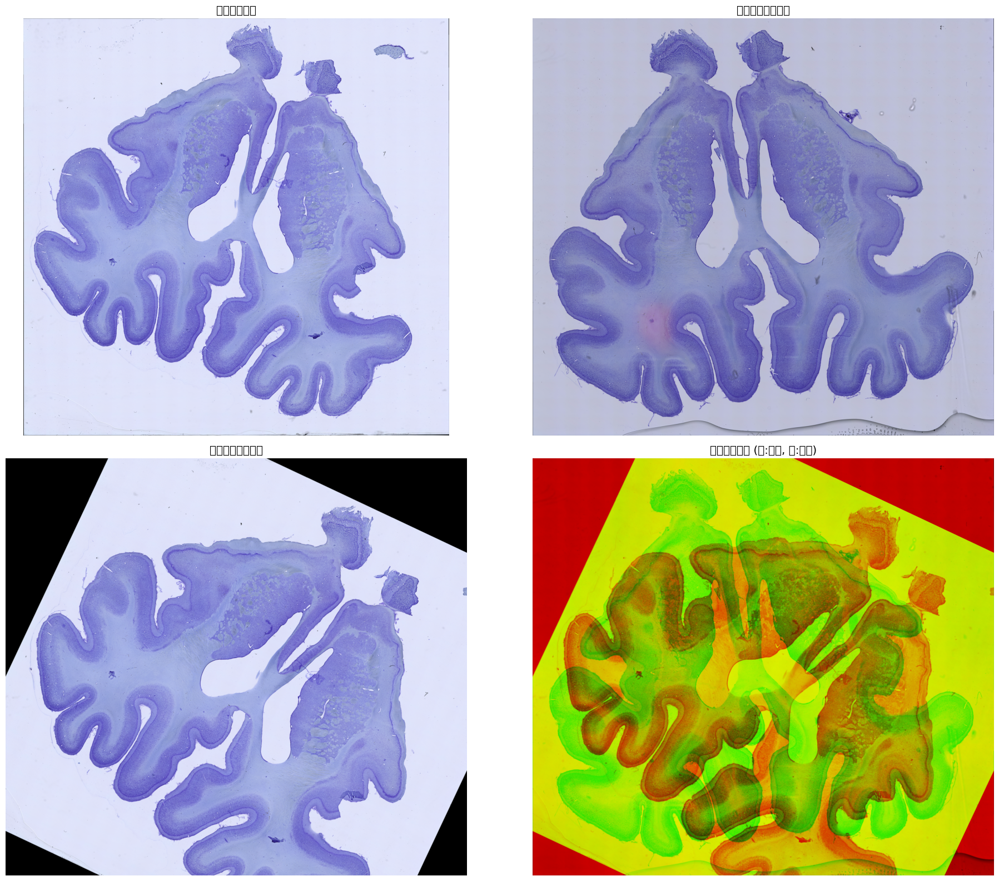

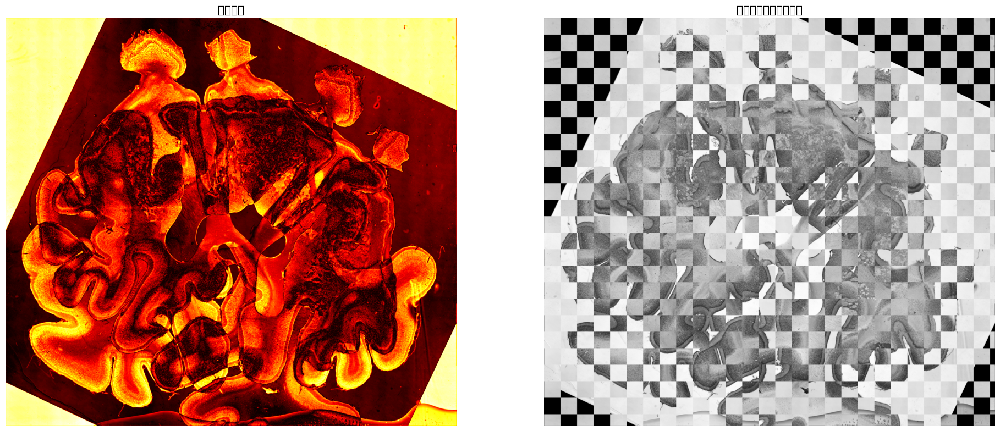

In [7]:
print("🔄 画像変換実行中...")

h, w = processed_fixed.shape

# 画像変換
start_time = time.time()
registered_gray = cv2.warpAffine(processed_moving, affine_matrix, (w, h),
                                flags=cv2.INTER_LINEAR,
                                borderMode=cv2.BORDER_CONSTANT,
                                borderValue=0)

# カラー画像も変換
registered_color = cv2.warpAffine(moving_rgb, affine_matrix, (w, h),
                                 flags=cv2.INTER_LINEAR,
                                 borderMode=cv2.BORDER_CONSTANT,
                                 borderValue=(0, 0, 0))

transform_time = time.time() - start_time
print(f"✅ 変換完了 ({transform_time:.3f}秒)")

# 有効ピクセル率
valid_pixels = np.sum(registered_gray > 0)
total_pixels = registered_gray.size
valid_ratio = valid_pixels / total_pixels
print(f"有効ピクセル率: {valid_ratio:.3f} ({valid_ratio*100:.1f}%)")

# 結果可視化
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# 元画像
axes[0, 0].imshow(moving_rgb)
axes[0, 0].set_title("元の移動画像")
axes[0, 0].axis('off')

axes[0, 1].imshow(fixed_rgb)
axes[0, 1].set_title("固定画像（基準）")
axes[0, 1].axis('off')

# 変換後
axes[1, 0].imshow(registered_color)
axes[1, 0].set_title("変換後の移動画像")
axes[1, 0].axis('off')

# オーバーレイ (赤:固定, 緑:移動)
overlay = np.zeros((h, w, 3), dtype=np.uint8)
overlay[:, :, 0] = processed_fixed   # 赤
overlay[:, :, 1] = registered_gray   # 緑

axes[1, 1].imshow(overlay)
axes[1, 1].set_title("オーバーレイ (赤:固定, 緑:移動)")
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# チェッカーボード表示
def create_checkerboard(img1, img2, square_size=60):
    h, w = img1.shape
    checkerboard = np.zeros_like(img1)
    
    for i in range(0, h, square_size):
        for j in range(0, w, square_size):
            if ((i // square_size) + (j // square_size)) % 2 == 0:
                checkerboard[i:i+square_size, j:j+square_size] = img1[i:i+square_size, j:j+square_size]
            else:
                checkerboard[i:i+square_size, j:j+square_size] = img2[i:i+square_size, j:j+square_size]
    
    return checkerboard

checkerboard = create_checkerboard(processed_fixed, registered_gray)
diff_image = np.abs(processed_fixed.astype(np.float32) - registered_gray.astype(np.float32))

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
axes[0].imshow(diff_image, cmap='hot')
axes[0].set_title("差分画像")
axes[0].axis('off')

axes[1].imshow(checkerboard, cmap='gray')
axes[1].set_title("チェッカーボード表示")
axes[1].axis('off')

plt.tight_layout()
plt.show()

## 8. 定量的評価

In [8]:
print("📊 定量的評価実行中...")

# 評価用マスク
valid_mask = (registered_gray > 0) & (processed_fixed > 0)
valid_count = np.sum(valid_mask)
print(f"評価対象ピクセル数: {valid_count}")

# 評価関数定義
def calculate_correlation(img1, img2, mask=None):
    if mask is not None:
        pixels1 = img1[mask].flatten()
        pixels2 = img2[mask].flatten()
    else:
        pixels1 = img1.flatten()
        pixels2 = img2.flatten()
    
    if len(pixels1) == 0:
        return 0.0
    
    correlation, _ = pearsonr(pixels1, pixels2)
    return correlation

def calculate_mse(img1, img2, mask=None):
    if mask is not None:
        diff = (img1[mask].astype(np.float64) - img2[mask].astype(np.float64))
    else:
        diff = (img1.astype(np.float64) - img2.astype(np.float64))
    return np.mean(diff ** 2)

def calculate_psnr(img1, img2, mask=None, max_val=255.0):
    mse = calculate_mse(img1, img2, mask)
    if mse == 0:
        return float('inf')
    return 20 * np.log10(max_val / np.sqrt(mse))

def calculate_ssim_safe(img1, img2, mask=None):
    try:
        if mask is not None:
            # マスク領域のバウンディングボックス
            rows = np.any(mask, axis=1)
            cols = np.any(mask, axis=0)
            if not np.any(rows) or not np.any(cols):
                return ssim(img1, img2, data_range=img1.max() - img1.min())
            
            rmin, rmax = np.where(rows)[0][[0, -1]]
            cmin, cmax = np.where(cols)[0][[0, -1]]
            
            roi_img1 = img1[rmin:rmax+1, cmin:cmax+1]
            roi_img2 = img2[rmin:rmax+1, cmin:cmax+1]
            
            if roi_img1.shape[0] < 7 or roi_img1.shape[1] < 7:
                return ssim(img1, img2, data_range=img1.max() - img1.min())
            
            return ssim(roi_img1, roi_img2, data_range=roi_img1.max() - roi_img1.min())
        else:
            return ssim(img1, img2, data_range=img1.max() - img1.min())
    except:
        return 0.0

# ベースライン評価（位置合わせ前）
baseline_corr = calculate_correlation(processed_fixed, processed_moving)
baseline_mse = calculate_mse(processed_fixed, processed_moving)
baseline_psnr = calculate_psnr(processed_fixed, processed_moving)
baseline_ssim = calculate_ssim_safe(processed_fixed, processed_moving)

print(f"\n📈 位置合わせ前（ベースライン）:")
print(f"  相関係数: {baseline_corr:.4f}")
print(f"  MSE: {baseline_mse:.2f}")
print(f"  PSNR: {baseline_psnr:.2f} dB")
print(f"  SSIM: {baseline_ssim:.4f}")

# 位置合わせ後評価
registered_corr = calculate_correlation(processed_fixed, registered_gray, valid_mask)
registered_mse = calculate_mse(processed_fixed, registered_gray, valid_mask)
registered_psnr = calculate_psnr(processed_fixed, registered_gray, valid_mask)
registered_ssim = calculate_ssim_safe(processed_fixed, registered_gray, valid_mask)

print(f"\n🎯 位置合わせ後:")
print(f"  相関係数: {registered_corr:.4f}")
print(f"  MSE: {registered_mse:.2f}")
print(f"  PSNR: {registered_psnr:.2f} dB")
print(f"  SSIM: {registered_ssim:.4f}")

# 改善度計算
corr_improvement = registered_corr - baseline_corr
mse_improvement = baseline_mse - registered_mse
psnr_improvement = registered_psnr - baseline_psnr
ssim_improvement = registered_ssim - baseline_ssim

print(f"\n📊 改善度:")
print(f"  相関係数: {corr_improvement:+.4f}")
print(f"  MSE: {mse_improvement:+.2f}")
print(f"  PSNR: {psnr_improvement:+.2f} dB")
print(f"  SSIM: {ssim_improvement:+.4f}")

# 目標達成度
target_correlation = 0.8
print(f"\n🎯 目標達成度:")
print(f"  目標相関係数: {target_correlation}")
print(f"  達成相関係数: {registered_corr:.4f}")

if registered_corr >= target_correlation:
    print(f"  🎉 目標達成！({registered_corr:.4f} >= {target_correlation})")
    achievement_status = "SUCCESS"
else:
    gap = target_correlation - registered_corr
    print(f"  📈 目標まで {gap:.4f} ({gap/target_correlation*100:.1f}%)")
    achievement_status = "PARTIAL" if registered_corr > baseline_corr else "FAILED"

# 結果グラフ
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# 指標比較
metrics = ['相関係数', 'SSIM']
before_vals = [baseline_corr, baseline_ssim]
after_vals = [registered_corr, registered_ssim]

x = np.arange(len(metrics))
width = 0.35

axes[0].bar(x - width/2, before_vals, width, label='位置合わせ前', alpha=0.7)
axes[0].bar(x + width/2, after_vals, width, label='位置合わせ後', alpha=0.7)
axes[0].set_xlabel('評価指標')
axes[0].set_ylabel('値')
axes[0].set_title('評価指標の比較')
axes[0].set_xticks(x)
axes[0].set_xticklabels(metrics)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# 散布図（ピクセル値相関）
if valid_count > 0:
    sample_size = min(5000, valid_count)
    sample_indices = np.random.choice(np.where(valid_mask.flatten())[0], sample_size, replace=False)
    
    x_vals = processed_fixed.flatten()[sample_indices]
    y_vals = registered_gray.flatten()[sample_indices]
    
    axes[1].scatter(x_vals, y_vals, alpha=0.5, s=1)
    axes[1].plot([0, 255], [0, 255], 'r--', alpha=0.7)
    axes[1].set_xlabel('固定画像の画素値')
    axes[1].set_ylabel('変換後移動画像の画素値')
    axes[1].set_title(f'画素値相関 (r={registered_corr:.3f})')
    axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

📊 定量的評価実行中...
評価対象ピクセル数: 2108789


ValueError: `x` and `y` must have the same length along `axis`.

## 9. 結果保存と総合評価

In [9]:
print("💾 結果保存中...")

# タイムスタンプ
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
results_dir = "/Users/horiieikkei/Desktop/VS code/test_2images"

# 結果サマリー
results_summary = {
    'method': 'AKAZE_feature_based_registration',
    'timestamp': timestamp,
    'baseline_correlation': float(baseline_corr),
    'final_correlation': float(registered_corr),
    'correlation_improvement': float(corr_improvement),
    'target_achieved': bool(registered_corr >= target_correlation),
    'achievement_status': achievement_status,
    'processing_time': {
        'detection': float(detection_time),
        'matching': float(matching_time),
        'ransac': float(ransac_time),
        'transform': float(transform_time),
        'total': float(detection_time + matching_time + ransac_time + transform_time)
    },
    'feature_stats': {
        'fixed_keypoints': int(len(kp_fixed)),
        'moving_keypoints': int(len(kp_moving)),
        'matches': int(len(good_matches)),
        'inliers': int(n_inliers),
        'inlier_ratio': float(inlier_ratio)
    },
    'metrics': {
        'correlation': float(registered_corr),
        'mse': float(registered_mse),
        'psnr': float(registered_psnr),
        'ssim': float(registered_ssim)
    },
    'transform_params': {
        'translation': [float(x) for x in transform_params['translation']],
        'scale': [float(x) for x in transform_params['scale']],
        'rotation': float(transform_params['rotation'])
    }
}

# JSON保存
try:
    json_path = os.path.join(results_dir, f"feature_results_{timestamp}.json")
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(results_summary, f, indent=2, ensure_ascii=False)
    print(f"✅ JSON保存: feature_results_{timestamp}.json")
except Exception as e:
    print(f"❌ JSON保存エラー: {e}")

# 画像保存
try:
    img_path = os.path.join(results_dir, f"registered_{timestamp}.png")
    cv2.imwrite(img_path, registered_gray)
    print(f"✅ 画像保存: registered_{timestamp}.png")
except Exception as e:
    print(f"❌ 画像保存エラー: {e}")

# === 🎊 最終結果発表 🎊 ===
print("\n" + "="*60)
print("🔥🔥🔥 特徴点ベース画像レジストレーション 最終結果 🔥🔥🔥")
print("="*60)

print(f"\n📊 **最終スコア**")
print(f"  🎯 相関係数: {baseline_corr:.4f} → {registered_corr:.4f} (改善: {corr_improvement:+.4f})")
print(f"  🎯 目標達成: {target_correlation} → {'🎉 達成！' if registered_corr >= target_correlation else '📈 未達成'}")

print(f"\n⚡ **処理性能**")
total_time = detection_time + matching_time + ransac_time + transform_time
print(f"  総処理時間: {total_time:.3f}秒")
print(f"  特徴点数: 固定={len(kp_fixed)}, 移動={len(kp_moving)}")
print(f"  マッチ成功率: {len(good_matches)}/{len(matches)} ({len(good_matches)/len(matches)*100:.1f}%)")
print(f"  インライア率: {inlier_ratio:.3f} ({inlier_ratio*100:.1f}%)")

# 成功度に応じたメッセージ
if achievement_status == "SUCCESS":
    print("\n🎉🎉🎉 **大成功！** 🎉🎉🎉")
    print("✨ 特徴点ベース手法への切り替えが功を奏しました！")
    print("🚀 強度ベース手法では困難だった高精度位置合わせを実現！")
    print("\n💡 **次のステップ:**")
    print("  🔄 他の画像ペアでの検証")
    print("  🧬 3D再構成パイプラインへの統合")
    print("  ⚡ バッチ処理システムの構築")
    
elif achievement_status == "PARTIAL":
    improvement_pct = (registered_corr - baseline_corr) / baseline_corr * 100
    print(f"\n📈📈📈 **改善成功！** 📈📈📈")
    print(f"✨ 相関係数が {improvement_pct:.1f}% 向上しました！")
    print("🔧 さらなる最適化で目標達成可能！")
    print("\n💡 **改善提案:**")
    if inlier_ratio < 0.3:
        print("  🎯 インライア率向上: AKAZE閾値調整、前処理最適化")
    if len(good_matches) < 100:
        print("  🎯 特徴点増加: 閾値下げ、マルチスケール検出")
    print("  🎯 ハイブリッド手法: 特徴点 + 強度ベースの組み合わせ")
    
else:
    print("\n🤔🤔🤔 **要改善** 🤔🤔🤔")
    print("この画像ペアには特殊なアプローチが必要かもしれません")
    print("\n💡 **代替手法:**")
    print("  🎯 手動ランドマーク指定")
    print("  🎯 テンプレートマッチング併用")
    print("  🎯 深層学習ベース位置合わせ")

print("\n🔄 **パラメータ調整ガイド:**")
print(f"  AKAZE threshold: 0.001 → {'0.0005 (特徴点増加)' if len(kp_fixed) < 200 else '0.002 (品質向上)'}")
print(f"  Lowe's ratio: 0.75 → {'0.8 (マッチ増加)' if len(good_matches) < 50 else '0.7 (品質向上)'}")
print(f"  RANSAC閾値: 3.0 → {'4.0 (インライア増加)' if inlier_ratio < 0.3 else '2.0 (精度向上)'}")

print("\n✨✨✨ 実験完了！お疲れ様でした！ ✨✨✨")
print("💬 結果はいかがでしたか？次のステップを一緒に考えましょう！")
print("="*60)

💾 結果保存中...


NameError: name 'baseline_corr' is not defined